In [1]:
# import the necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from PIL import Image
import os
import cv2

pd.set_option('display.max_rows',1000)
pd.set_option('display.max_columns',1000)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Load train_masks.csv

In [2]:
# load data
train_masks_df = pd.read_csv('train_masks.csv')

In [3]:
# train_masks_df shape
print('train_masks_df shape: {}'.format(train_masks_df.shape))

train_masks_df shape: (5088, 2)


In [4]:
# first 5 rows
train_masks_df.head()

,img,rle_mask
0,00087a6bd4dc_01.jpg,879386 40 881253 141 883140 205 885009 17 8850...
1,00087a6bd4dc_02.jpg,873779 4 875695 7 877612 9 879528 12 881267 15...
2,00087a6bd4dc_03.jpg,864300 9 866217 13 868134 15 870051 16 871969 ...
3,00087a6bd4dc_04.jpg,879735 20 881650 26 883315 92 883564 30 885208...
4,00087a6bd4dc_05.jpg,883365 74 883638 28 885262 119 885550 34 88716...


In [5]:
# last 5 rows
train_masks_df.tail()

,img,rle_mask
5083,fff9b3a5373f_12.jpg,386005 13 387915 27 389829 34 391744 38 393660...
5084,fff9b3a5373f_13.jpg,393674 6 395585 19 397498 26 399412 32 401327 ...
5085,fff9b3a5373f_14.jpg,401397 9 403309 19 405223 26 405389 145 407138...
5086,fff9b3a5373f_15.jpg,407257 6 407393 89 409171 12 409263 179 411086...
5087,fff9b3a5373f_16.jpg,407441 77 409327 151 411222 205 413122 248 415...


In [6]:
# train_masks info
train_masks_df.info() # no missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5088 entries, 0 to 5087
Data columns (total 2 columns):
img         5088 non-null object
rle_mask    5088 non-null object
dtypes: object(2)
memory usage: 79.6+ KB


### Load metadata.csv

In [7]:
# load data
metadata_df = pd.read_csv('metadata.csv')

In [8]:
# metadata_df shape
print('metadata_df shape: {}'.format(metadata_df.shape))

metadata_df shape: (6572, 6)


In [9]:
# first 5 rows
metadata_df.head()

,id,year,make,model,trim1,trim2
0,0004d4463b50,2014.0,Acura,TL,TL,w/SE
1,00087a6bd4dc,2014.0,Acura,RLX,RLX,w/Tech
2,000aa097d423,2012.0,Mazda,MAZDA6,MAZDA6,i Sport
3,000f19f6e7d4,2016.0,Chevrolet,Camaro,Camaro,SS
4,00144e887ae9,2015.0,Acura,TLX,TLX,SH-AWD V6 w/Advance Pkg


In [10]:
# last 5 rows
metadata_df.tail()

,id,year,make,model,trim1,trim2
6567,ffdf67d8d44b,2014.0,Mercedes-Benz,CLA,CLA,CLA250 w/ Sport Pkg
6568,ffe45737b4af,2014.0,Mercedes-Benz,E-Class,E-Class,E350 Sport
6569,fff013bbf988,2014.0,Toyota,Tundra,Tundra,Platinum W/ Towing Pkg
6570,fff341f26a19,2013.0,Nissan,Altima,Altima,3.5 SL
6571,fff9b3a5373f,2011.0,Land Rover,Range Rover,Range Rover,Supercharged w/Autobiography Pkg


In [11]:
# metadata info
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6572 entries, 0 to 6571
Data columns (total 6 columns):
id       6572 non-null object
year     6561 non-null float64
make     6561 non-null object
model    6561 non-null object
trim1    6510 non-null object
trim2    6495 non-null object
dtypes: float64(1), object(5)
memory usage: 308.1+ KB


In [12]:
# check out null values in 'year' column
year_idx = list(np.where(metadata_df['year'].isna())[0])
metadata_df.iloc[year_idx,:]

,id,year,make,model,trim1,trim2
651,1bbbb18092ca,NaN,NaN,NaN,Corvette,Z16 Grand Sport
1789,4566d0394275,NaN,NaN,NaN,4Runner,Limited
2138,520b02fd768c,NaN,NaN,NaN,V60,T5 Premier
2373,5d1a742169df,NaN,NaN,NaN,Santa Fe Sport,2.4L
2400,5e2197e9a693,NaN,NaN,NaN,Soul,Base
2966,7362a3e9a140,NaN,NaN,NaN,LEAF,SL
4027,9d3fe02e9736,NaN,NaN,NaN,Genesis Coupe,3.8 Ultimate
4270,a707401e0d5e,NaN,NaN,NaN,Sonata,SE
4630,b3178ab642da,NaN,NaN,NaN,Terrain,SLE-1
5222,c9840d882da6,NaN,NaN,NaN,Terrain,SLE-2


In [13]:
# check out null values in 'make' column
make_idx = list(np.where(metadata_df['make'].isna())[0])
metadata_df.iloc[make_idx,:]

,id,year,make,model,trim1,trim2
651,1bbbb18092ca,NaN,NaN,NaN,Corvette,Z16 Grand Sport
1789,4566d0394275,NaN,NaN,NaN,4Runner,Limited
2138,520b02fd768c,NaN,NaN,NaN,V60,T5 Premier
2373,5d1a742169df,NaN,NaN,NaN,Santa Fe Sport,2.4L
2400,5e2197e9a693,NaN,NaN,NaN,Soul,Base
2966,7362a3e9a140,NaN,NaN,NaN,LEAF,SL
4027,9d3fe02e9736,NaN,NaN,NaN,Genesis Coupe,3.8 Ultimate
4270,a707401e0d5e,NaN,NaN,NaN,Sonata,SE
4630,b3178ab642da,NaN,NaN,NaN,Terrain,SLE-1
5222,c9840d882da6,NaN,NaN,NaN,Terrain,SLE-2


In [14]:
# check out null values in 'model' column
model_idx = list(np.where(metadata_df['model'].isna())[0])
metadata_df.iloc[model_idx,:]

,id,year,make,model,trim1,trim2
651,1bbbb18092ca,NaN,NaN,NaN,Corvette,Z16 Grand Sport
1789,4566d0394275,NaN,NaN,NaN,4Runner,Limited
2138,520b02fd768c,NaN,NaN,NaN,V60,T5 Premier
2373,5d1a742169df,NaN,NaN,NaN,Santa Fe Sport,2.4L
2400,5e2197e9a693,NaN,NaN,NaN,Soul,Base
2966,7362a3e9a140,NaN,NaN,NaN,LEAF,SL
4027,9d3fe02e9736,NaN,NaN,NaN,Genesis Coupe,3.8 Ultimate
4270,a707401e0d5e,NaN,NaN,NaN,Sonata,SE
4630,b3178ab642da,NaN,NaN,NaN,Terrain,SLE-1
5222,c9840d882da6,NaN,NaN,NaN,Terrain,SLE-2


In [15]:
# check out null values in 'trim1' column
trim1_idx = list(np.where(metadata_df['trim1'].isna())[0])
metadata_df.iloc[trim1_idx,:]

,id,year,make,model,trim1,trim2
165,066aa3c1ae8b,2014.0,Kia,Soul,NaN,NaN
461,13987558f6b2,2012.0,Nissan,Murano,NaN,NaN
469,13d26db4c06f,2014.0,Toyota,Camry,NaN,NaN
491,14a7ab669d82,2014.0,Ford,Mustang,NaN,NaN
682,1cb5142e3d42,2012.0,Kia,Optima,NaN,NaN
826,21bacf13c14a,2014.0,Chevrolet,Cruze,NaN,NaN
977,275ea9e308d7,2013.0,Hyundai,Elantra,NaN,NaN
1030,2974787bc65f,2011.0,Ford,F-150,NaN,NaN
1035,298b38c2ff59,2012.0,Nissan,Rogue,NaN,NaN
1102,2bcf085c42e0,2013.0,Infiniti,G37 Sedan,NaN,NaN


In [16]:
# check out null values in 'trim2' column
trim2_idx = list(np.where(metadata_df['trim2'].isna())[0])
metadata_df.iloc[trim2_idx,:]

,id,year,make,model,trim1,trim2
165,066aa3c1ae8b,2014.0,Kia,Soul,NaN,NaN
461,13987558f6b2,2012.0,Nissan,Murano,NaN,NaN
469,13d26db4c06f,2014.0,Toyota,Camry,NaN,NaN
491,14a7ab669d82,2014.0,Ford,Mustang,NaN,NaN
682,1cb5142e3d42,2012.0,Kia,Optima,NaN,NaN
711,1d84408bf74f,2010.0,Lexus,LX 570,LX 570,NaN
804,21072f049ff6,2012.0,Acura,TL,TL,NaN
826,21bacf13c14a,2014.0,Chevrolet,Cruze,NaN,NaN
877,237edca89911,2012.0,Acura,TSX,TSX,NaN
936,25bb0d68c9c7,2013.0,Infiniti,JX35,JX35,NaN


#### <font color='blue'> Missing values in year, make, model columns share the same indices in metadata_df
    
Conclusion for trim1 and trim2?

### 1) File counts in high quality images for train and test data sets and train masks

### 2) Retrieve unique ID for train and test data sets as each car has 16 images taken from different angles

In [17]:
# file counts
train = os.listdir('./train_hq')
train_masks = os.listdir('./train_masks')
test = os.listdir('./test_hq')
print('Train files count: {}\nTrain_Masks files count: {}\nTest files count: {}'.\
     format(len(train),len(test),len(train_masks)),'\n')

# get unique ids
train_ids = list(set([image.split('_')[0] for image in train]))
masks_ids = list(set([image.split('_')[0] for image in train_masks]))
test_ids = list(set([image.split('_')[0] for image in test]))

# no assertion error will be returned unless ids are not multiple of 16
assert len(train_ids)*16 == len(train)
assert len(test_ids)*16 == len(test)
assert len(masks_ids)*16 == len(train_masks)

print('Train files unique ID count: {}\nTrain_Masks files unique ID count: {}\nTest files unique ID count: {}'.\
     format(len(train_ids),len(masks_ids),len(test_ids)))

Train files count: 5088
Train_Masks files count: 100064
Test files count: 5088 

Train files unique ID count: 318
Train_Masks files unique ID count: 318
Test files unique ID count: 6254


### Utility functions
    Create two utility functions:
    1) To retrieve directory path for car images or masks
    2) To convert the image or mask and return a numpy array

In [18]:
def get_image_path(image_id,id_num,get_mask=False):
    '''
    To retrieve directory path for car images or masks
    '''
    if id_num in range(1,17):
        if len(str(id_num)) == 1:
            id_num = '0' + str(id_num)
        else:
            id_num = str(id_num)
    else:
        raise Exception('No mask with this ID No')
    
    if get_mask:
        if image_id in masks_ids:
            return './train_masks/' + image_id + '_' + id_num + '_mask.gif'
        else:
            raise Exception("No mask with this ID")
    elif image_id in train_ids:
        return './train_hq/' + image_id + '_' + id_num + '.jpg'
    elif image_id in test_ids:
        return './test_hq/' + image_id + '_' + id_num + '.jpg'
    else:
        raise Exception('No train or test image with this ID')
        
def get_image_array(image_path):
    '''
    To convert the image or mask and return a numpy array
    '''
    img = Image.open(image_path)
    return np.array(img)

### Display a single car before and after masking

Image is: cf89c3220bc4_01 

Image shape: (1280, 1918, 3)
Image type: uint8
Mask shape: (1280, 1918)
Mask type: uint8 



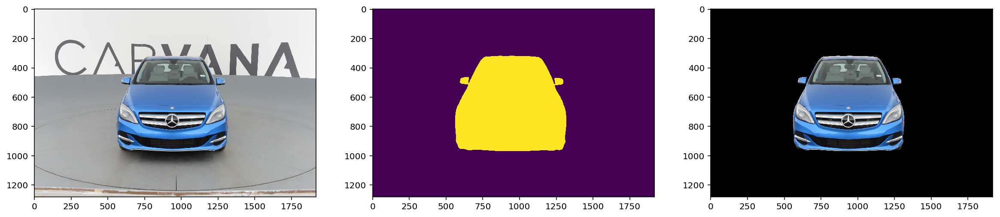

In [19]:
# display image of train_ids[0] with id_num = 1
image_id = train_ids[0]
id_num = 1
if len(str(id_num)) == 1:
    print('Image is: {}'.format(image_id+'_'+'0'+str(id_num)),'\n')
else:
    print('Image is: {}'.format(image_id+'_'+str(id_num)),'\n')

plt.figure(figsize=(20,20))

img = get_image_array(get_image_path(image_id,id_num))
mask = get_image_array(get_image_path(image_id,id_num,get_mask=True))
img_masked = cv2.bitwise_and(img,img,mask=mask)
print('Image shape: {}\nImage type: {}\nMask shape: {}\nMask type: {}'.\
     format(img.shape,img.dtype,mask.shape,mask.dtype),'\n')

plt.subplot(131)
plt.imshow(img)
plt.subplot(132)
plt.imshow(mask)
plt.subplot(133)
plt.imshow(img_masked)

plt.show()

### Conversion functions
    Two functions will be written for this task:
    1) rle_encode() - to convert ground truth mask to run length encoded mask
    2) rle_to_string() - to convert the run length encoded mask from 1) to string type

In [20]:
def rle_encode(mask_image):
    '''
    To convert ground truth mask to run length encoded mask
    '''
    pixels = mask_image.flatten() # converting mask array to 1-dim
    
    # first and last element of mask array will be set to value 0 so as to
    # avoid issues with value 1 at these 'positions'
    # it's not expected that these values will be non-zero for an accurate
    # mask, hence, by setting them to 0 shouldn't harm the score
    pixels[0] = 0
    pixels[-1] = 0
    
    # conversion starts here
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    return runs

def rle_to_string(runs):
    '''
    To convert data type of run length encoded mask to string
    '''
    return ' '.join(str(x) for x in runs)

### Check that the run length encoded mask (after converting from ground truth) corresponds to its respective RLE signature in train_masks_df

In [21]:
image_id = train_ids[0]
id_num = 1

file_name = get_image_path(image_id,id_num).split('/')[-1]
mask = get_image_array(get_image_path(image_id,id_num,get_mask=True))
mask_df_rle = train_masks_df[train_masks_df['img'] == file_name]['rle_mask'].iloc[0]

assert rle_to_string(rle_encode(mask)) == mask_df_rle, 'Mask rle don\'t match'
print('Mask rle match!')

Mask rle match!


### Display several cars (at 16 different angles) from train data set

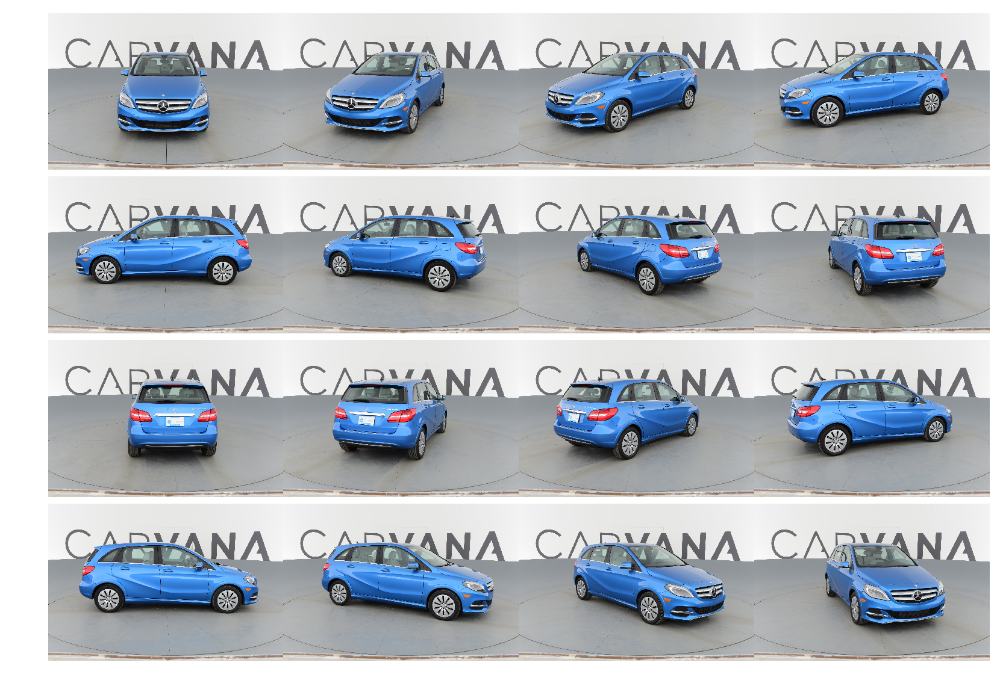

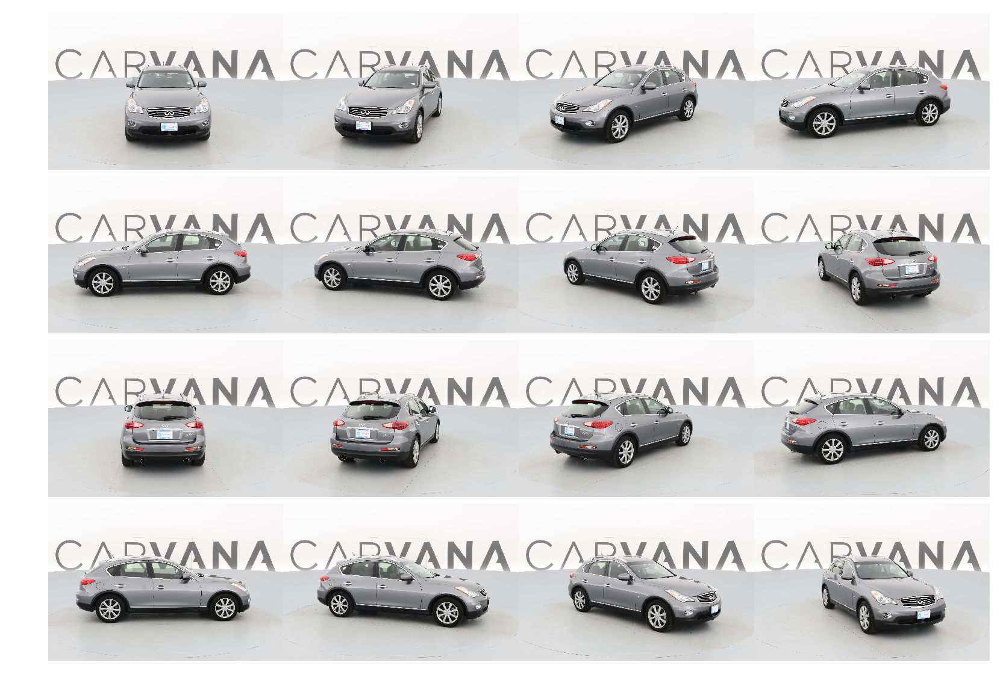

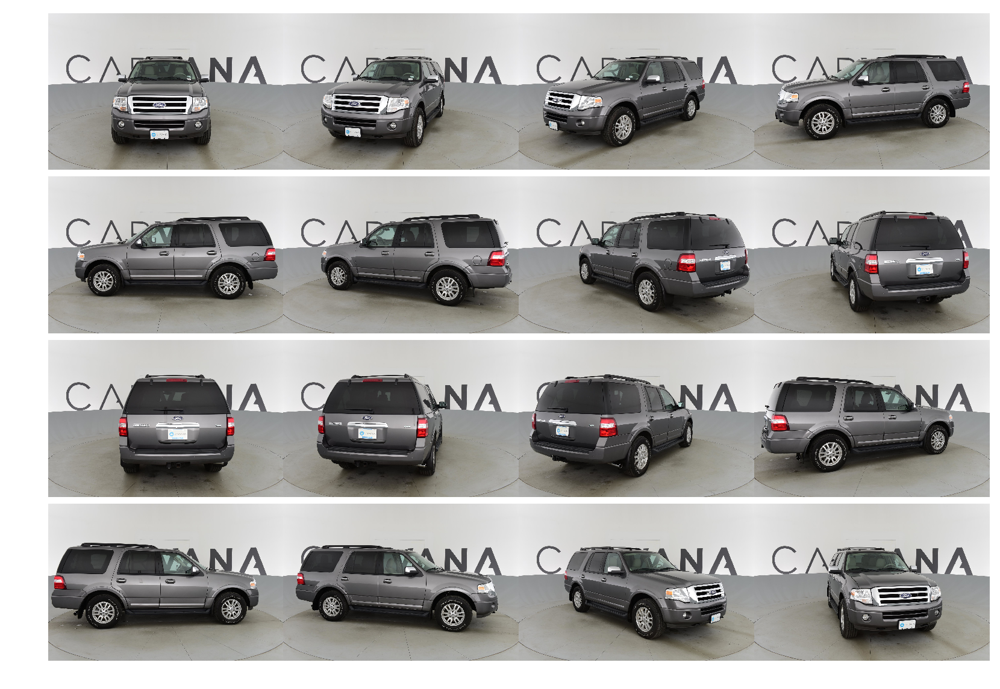

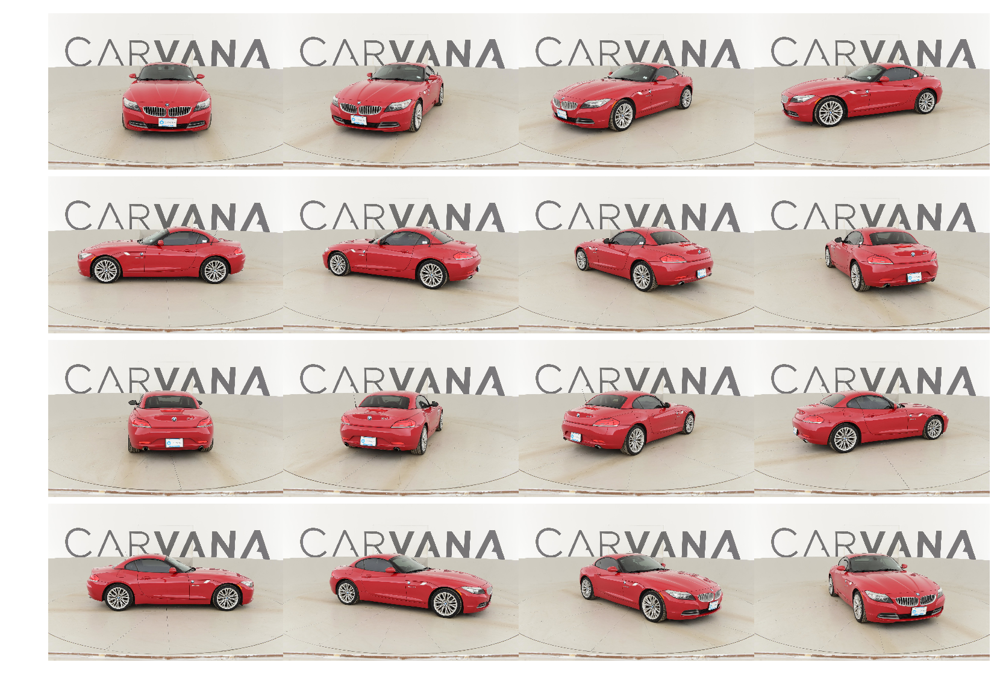

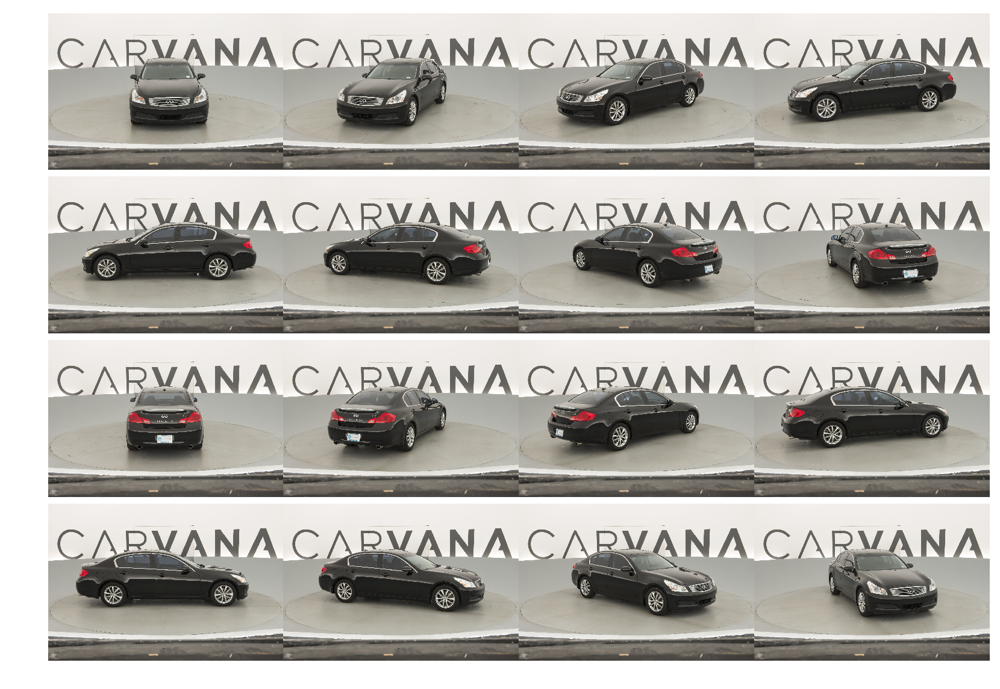

In [79]:
image_id = train_ids[:5]
id_num = list(range(1,17))

for car_image in image_id:
    fig, axs = plt.subplots(4,4,figsize=(14,10))
    plt.rc('axes',grid=False)
    plt.subplots_adjust(wspace=0,hspace=0)
    axs = axs.ravel()
    for id in id_num:    
        img = get_image_array(get_image_path(car_image,id))
        num = id - 1
        axs[num].axis('off')
        axs[num].imshow(img)

### How many different cars in metadata_df

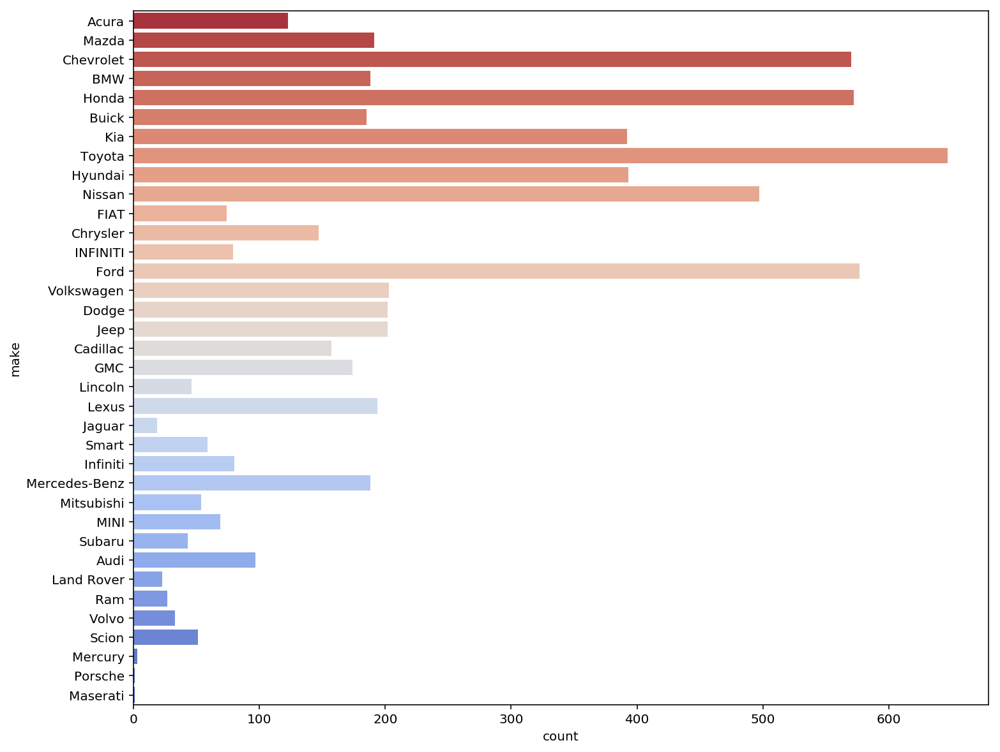

In [86]:
plt.figure(figsize=(12,10))
sns.countplot(y='make',data=metadata_df,palette='coolwarm_r')
plt.show()